# Description
* Inputs are mtx file from cellranger count
* Some mitochondrial genes will be manually deleted
* To investigate if the output will be similar to read_loom
* Why: Because read_loom results in less mitochondrial genes after filtering compared to read_10x
* The output will be used to compared with read_loom of Scanpy package

# Workflow begin

## Calling packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

## Set up environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi = 80, facecolor = 'white')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


## Get dataset

In [3]:
%%time
Raw_adata_10x = sc.read_10x_mtx("/home/nguyen/Estrus_cellranger_count/Estrus_Raw/")

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
CPU times: user 58.5 s, sys: 386 ms, total: 58.9 s
Wall time: 1min 2s


In [4]:
Raw_adata_10x.var_names_make_unique()

In [5]:
Raw_adata_10x

AnnData object with n_obs × n_vars = 6599 × 31253
    var: 'gene_ids', 'feature_types'

* Input has:
     + 31253 genes
     + 6599 cells

# Preprocessing

normalizing counts per cell
    finished (0:00:00)


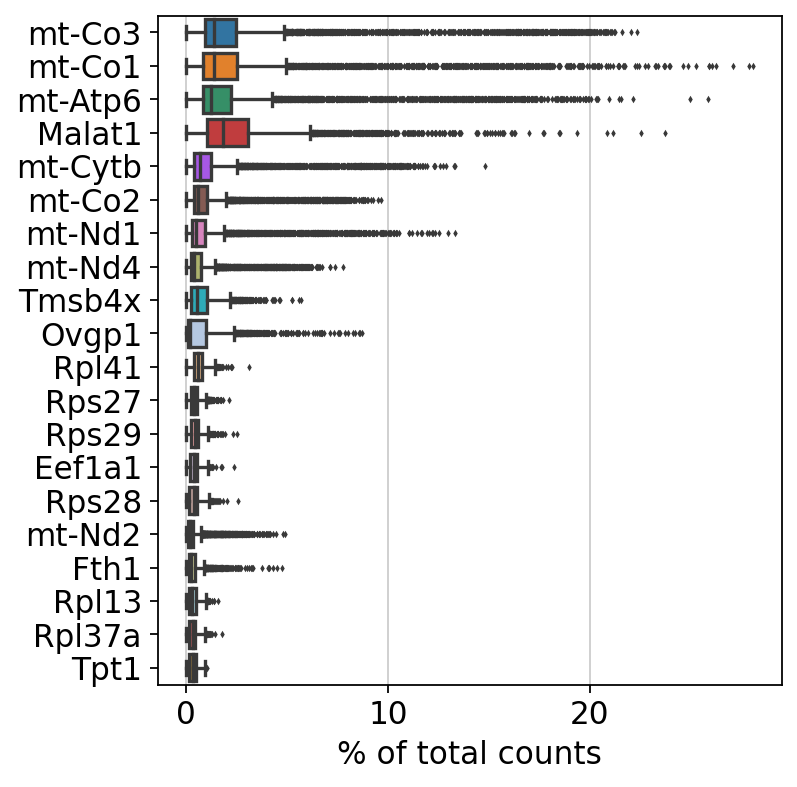

In [6]:
#Show 20 highest expressed genes
sc.pl.highest_expr_genes(Raw_adata_10x, n_top=20) 

## Basic filtering:
* Filter out genes that are detected in less than 3 cells 
* Filter out cells that have less than 200 genes expressed

In [7]:
%%time
sc.pp.filter_cells(Raw_adata_10x,min_genes=200)
sc.pp.filter_genes(Raw_adata_10x, min_cells=3)

filtered out 118 cells that have less than 200 genes expressed
filtered out 11833 genes that are detected in less than 3 cells
CPU times: user 263 ms, sys: 78.5 ms, total: 341 ms
Wall time: 342 ms


In [8]:
Raw_adata_10x

AnnData object with n_obs × n_vars = 6481 × 19420
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

* Output:
     + 19420 genes 
     + 6481 cells

## Calculate percentage of mitochondrial genes

* High proportions are indicative of poor-quality cells, possibly because of loss of cytoplasmic RNA from perforated cells. 
* The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.
* With pp.calculate_qc_metrics, we can compute many metrics very efficiently.

In [9]:
# Add "mt" column to object
Raw_adata_10x.var['mt'] = Raw_adata_10x.var_names.str.startswith('mt-')

In [10]:
# This is the list of genes that start with mt
print(Raw_adata_10x.var['mt'][Raw_adata_10x.var['mt'] == True])

mt-Nd1     True
mt-Nd2     True
mt-Co1     True
mt-Co2     True
mt-Atp8    True
mt-Atp6    True
mt-Co3     True
mt-Nd3     True
mt-Nd4l    True
mt-Nd4     True
mt-Nd5     True
mt-Nd6     True
mt-Cytb    True
Name: mt, dtype: bool


## Manually delete some mitochondrial genes
* "mt-Nd6" and "mt-Cytb" will be manually deleted
* Why: Because after filtering, read_loom does not have those genes 

In [11]:
genes_to_keep = [name for name in Raw_adata_10x.var_names if not name in ["mt-Nd6","mt-Cytb"]]
Raw_adata_10x = Raw_adata_10x[:,genes_to_keep]
print(Raw_adata_10x.var['mt'][Raw_adata_10x.var['mt'] == True])

mt-Nd1     True
mt-Nd2     True
mt-Co1     True
mt-Co2     True
mt-Atp8    True
mt-Atp6    True
mt-Co3     True
mt-Nd3     True
mt-Nd4l    True
mt-Nd4     True
mt-Nd5     True
Name: mt, dtype: bool


* "mt-Nd6" and "mt-Cytb" has been deleted

In [12]:
Raw_adata_10x

View of AnnData object with n_obs × n_vars = 6481 × 19418
    obs: 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt'

* This is a testing step to see if only those genes were deleted
* Numbers of genes went down from 19420 to 19418
* Only 2 genes were deleted

In [13]:
# Calculate percentage of mito genes
sc.pp.calculate_qc_metrics(Raw_adata_10x, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Trying to set attribute `.obs` of view, copying.


* Note: percentage of mito genes will be calculated and stored in pct_counts_mt row for each cell

In [14]:
# This is the data in "pct_counts_mt" row
Raw_adata_10x.obs.pct_counts_mt.head()

AAACCTGAGGGTATCG-1     7.600596
AAACCTGCAAACTGCT-1    10.919399
AAACCTGCAATCCAAC-1     4.484667
AAACCTGCAGATCGGA-1     9.019138
AAACCTGCATTGTGCA-1     4.978685
Name: pct_counts_mt, dtype: float32

... storing 'feature_types' as categorical
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


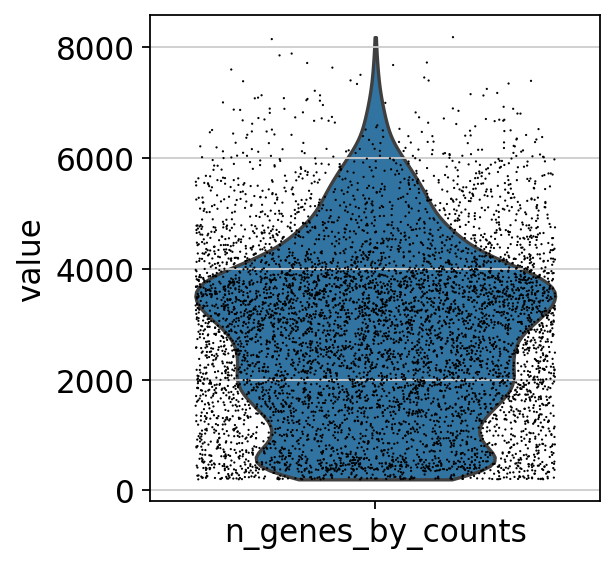

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


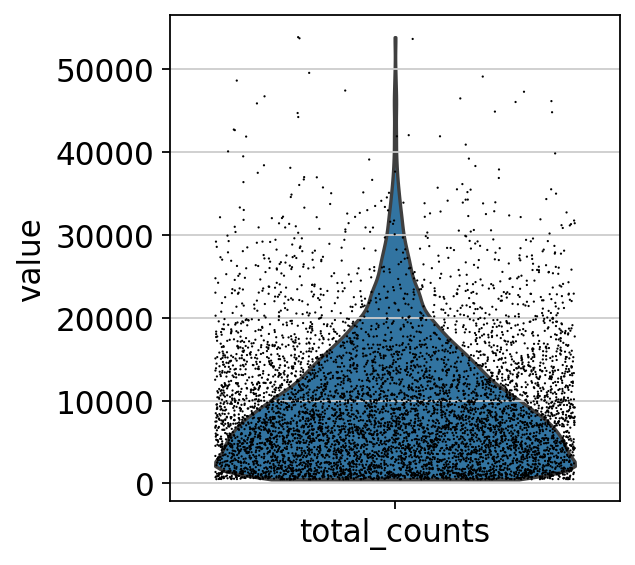

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


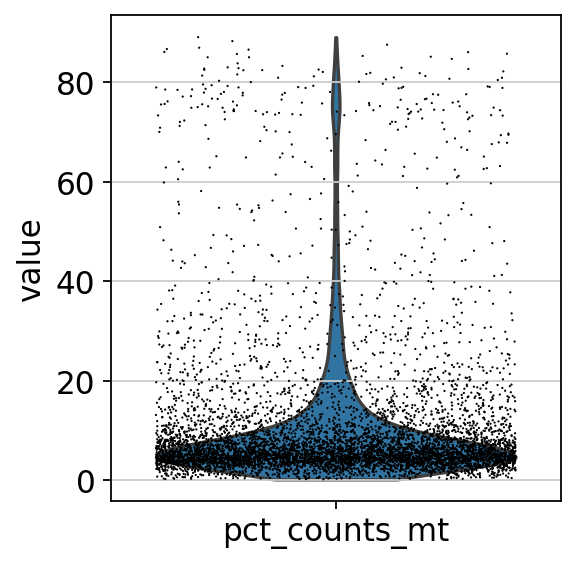

In [15]:
sc.pl.violin(Raw_adata_10x,'n_genes_by_counts',jitter=0.4) 
sc.pl.violin(Raw_adata_10x,'total_counts',jitter=0.4)
sc.pl.violin(Raw_adata_10x,'pct_counts_mt',jitter=0.4)

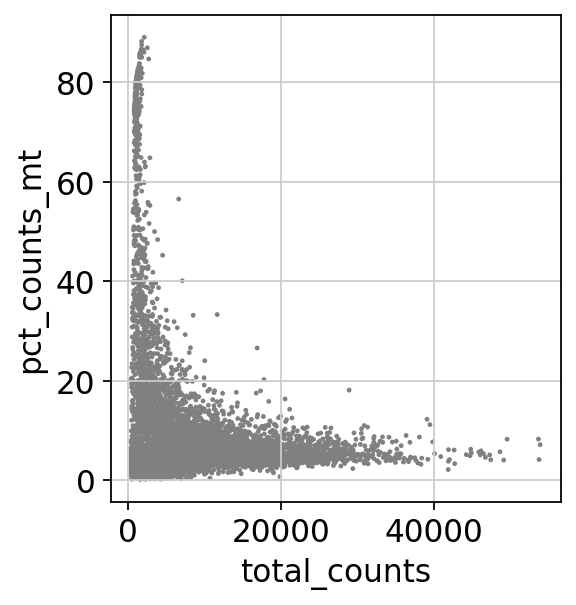

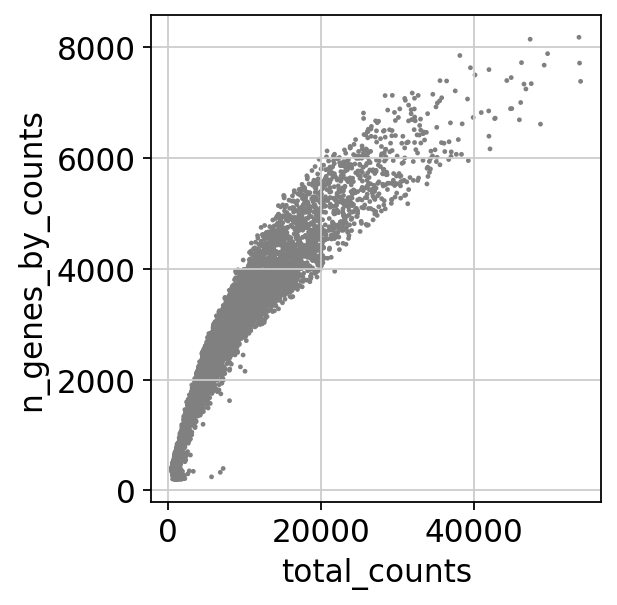

In [16]:
sc.pl.scatter(Raw_adata_10x, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(Raw_adata_10x, x='total_counts', y='n_genes_by_counts')

## Filter out low-quality cells
* We filter out cells that have unique feature counts over 6000
* Because any cell that has more than 6000 genes are likely doublets
* Note: Seurat tutorial used 2500 instead of 6000
* We also filter out cells that have more than 5% mitochondrial genes
* Because those are likely to be dead cells

In [17]:
%%time
# This is also known as slicing
Raw_adata_10x = Raw_adata_10x[Raw_adata_10x.obs.n_genes<6000,:]

CPU times: user 2.29 ms, sys: 50 µs, total: 2.34 ms
Wall time: 2.27 ms


In [18]:
Raw_adata_10x

View of AnnData object with n_obs × n_vars = 6321 × 19418
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [19]:
%%time
Raw_adata_10x = Raw_adata_10x[Raw_adata_10x.obs.pct_counts_mt<5,:]

CPU times: user 1.86 ms, sys: 41 µs, total: 1.9 ms
Wall time: 1.84 ms


In [20]:
Raw_adata_10x

View of AnnData object with n_obs × n_vars = 2584 × 19418
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

* After filtering step, the dataset is left with:
     + 19418 genes 
     + 2584 cells

## Normalizing the data
* Perform normalization method
* This is then natural-log transformed using log1p
* Normalization ensures that the gene expression in each cell doesn't overpower the expression of lesser expressed genes. 

In [21]:
%%time
#If target_sum = None then the medium of UMI_counts/reads per cell is assigned to all cells to have counts comparable among all cells
sc.pp.normalize_total(Raw_adata_10x, target_sum=None)
#Logarithmize the data matrix. Makes it easier to visualize data.
sc.pp.log1p(Raw_adata_10x)

normalizing counts per cell
    finished (0:00:00)


/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


CPU times: user 173 ms, sys: 7.4 ms, total: 181 ms
Wall time: 244 ms


## Identification of highly variable features (feature selection)

In [22]:
%%time
sc.pp.highly_variable_genes(Raw_adata_10x, n_top_genes=5000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 393 ms, sys: 15.7 ms, total: 409 ms
Wall time: 412 ms


## Plotting highly variable features

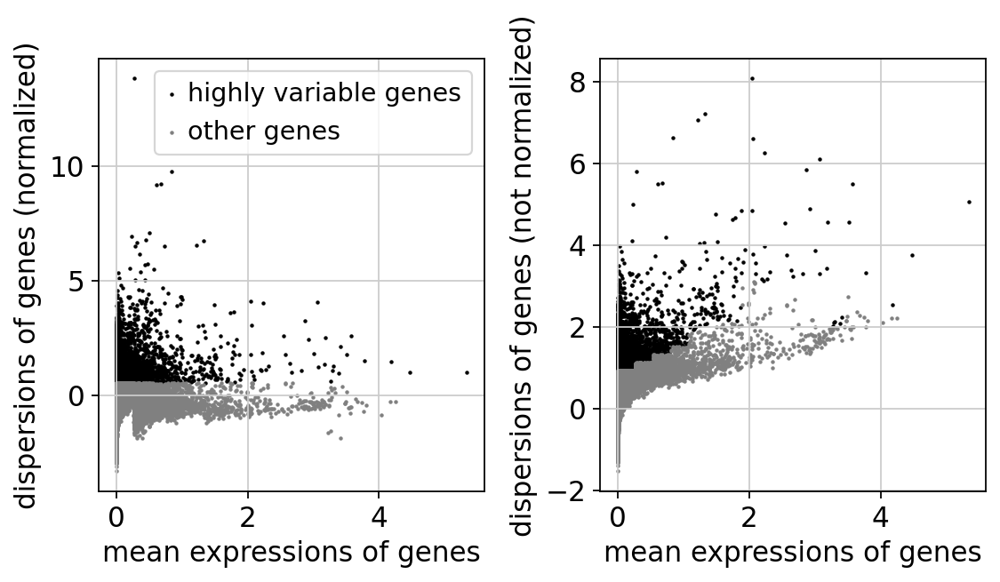

In [23]:
sc.pl.highly_variable_genes(Raw_adata_10x)

## Regress out data and perform scaling
* Regressing out total counts per cell and pct_counts_mt before scaling. 
* Take out mitochondrial genes before scaling (analyzing) the data 
* Because mito_genes shouldn't be accounted for cell population analysis.

In [24]:
%%time
# Scaling = takes all your genes and makes sure that they do not overpower other genes in all cells. 
# 'max_volume' is set to 10 to follow Seurats vignette
sc.pp.regress_out(Raw_adata_10x,['total_counts', 'pct_counts_mt'])
sc.pp.scale(Raw_adata_10x, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:43)
CPU times: user 42.5 s, sys: 185 ms, total: 42.6 s
Wall time: 43.7 s


## Perform linear dimensional reduction (PCA)

In [25]:
%%time
# arpack is default
# Reduce the dimensionality of the data by running principal component analysis (PCA), 
# which reveals the main axes of variation and denoises the data.
sc.tl.pca(Raw_adata_10x, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
CPU times: user 11.8 s, sys: 4.34 s, total: 16.1 s
Wall time: 765 ms


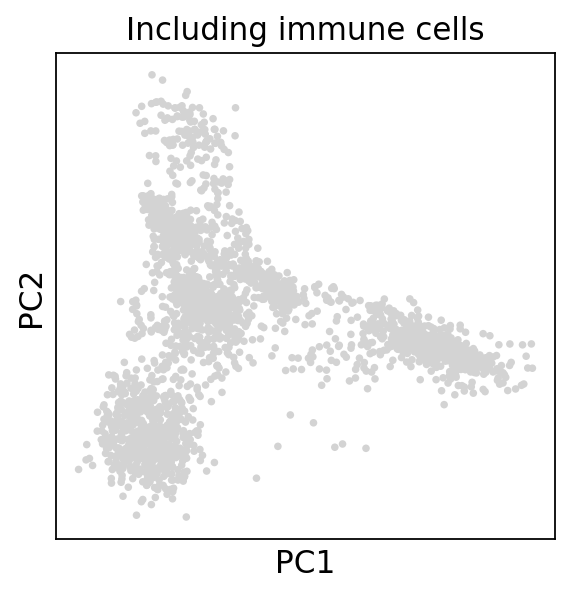

In [26]:
sc.pl.pca(Raw_adata_10x, title="Including immune cells", save = "Including_immune_cells.pdf")

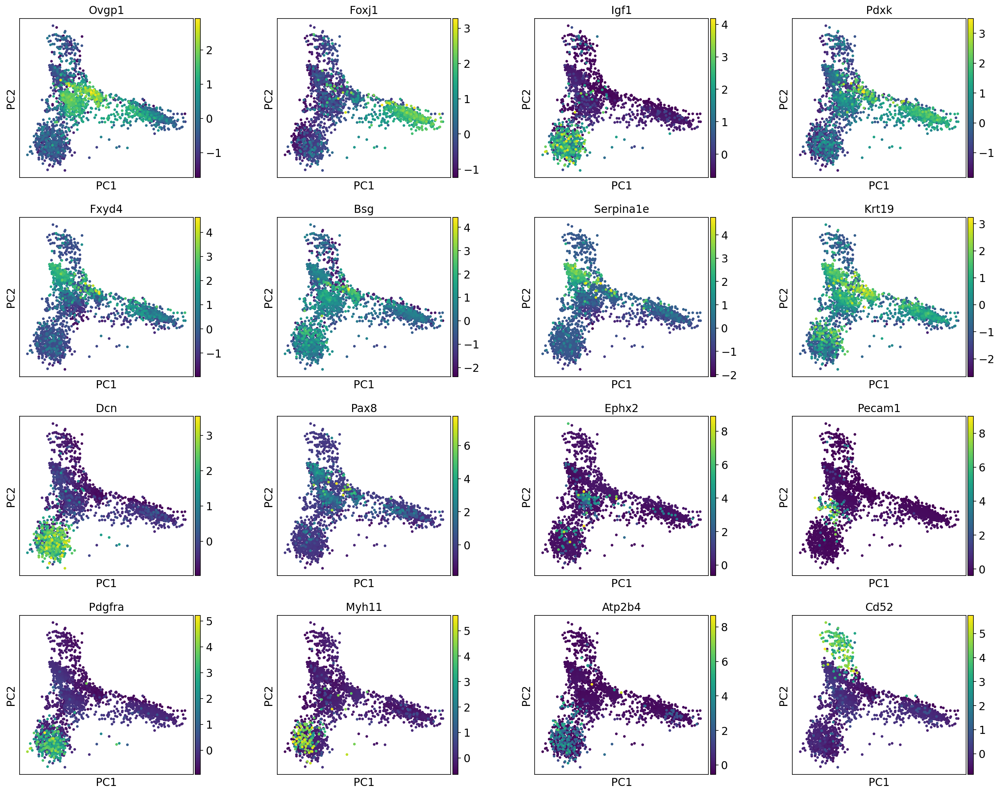

In [27]:
sc.pl.pca(Raw_adata_10x, wspace=0.35,
          color=['Ovgp1', 
              'Foxj1', 'Igf1', 'Pdxk', 
                  'Fxyd4', 'Bsg', 
              'Serpina1e', 'Krt19', 
              'Dcn', 'Pax8',
                  'Ephx2', 
              'Pecam1', 'Pdgfra', 'Myh11', 'Atp2b4', 
              'Cd52'], save = "Including_immune_cells1.pdf")

## Determine the ‘dimensionality’ of the data
* An elbow plot often corresponds well enough with the significant dims and is much faster to run 
* According to the graph below, choose the first 22 principle components to use

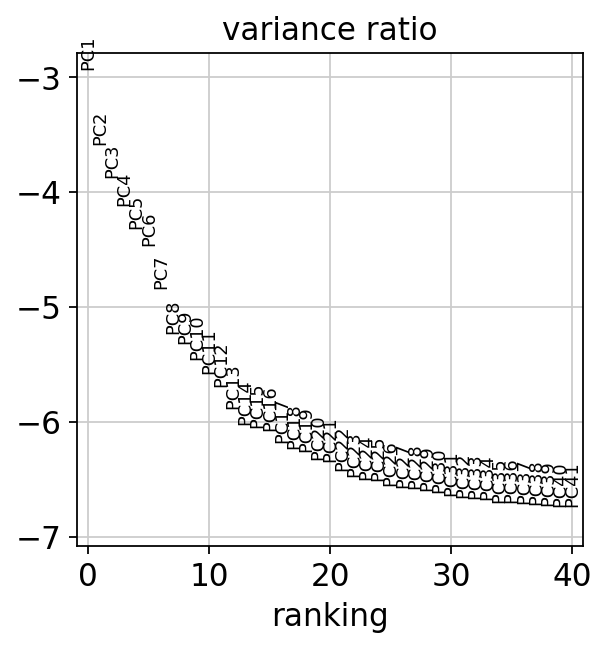

In [28]:
sc.pl.pca_variance_ratio(Raw_adata_10x,n_pcs=40,log=True)

## Computing the neighborhood graph

In [29]:
%%time
#Set n_pcs according to the elbow plot
sc.pp.neighbors(Raw_adata_10x,n_neighbors=10,n_pcs=22) 

computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
CPU times: user 2.8 s, sys: 1.46 s, total: 4.26 s
Wall time: 1.5 s


## Embedding the neighborhood graph

In [30]:
%%time
sc.tl.umap(Raw_adata_10x)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
CPU times: user 3.17 s, sys: 3.68 s, total: 6.85 s
Wall time: 2.34 s


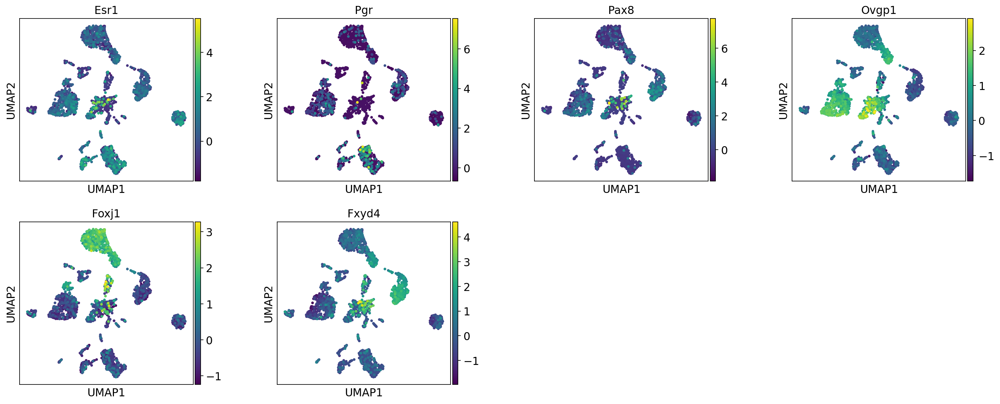

In [31]:
sc.pl.umap(Raw_adata_10x, wspace=0.35,
           color=['Esr1', 'Pgr', 'Pax8', 'Ovgp1', 'Foxj1', 'Fxyd4'])

## Find cell clusters using Leiden's method

In [32]:
%%time
sc.tl.leiden(Raw_adata_10x, resolution=0.1)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 61.4 ms, sys: 0 ns, total: 61.4 ms
Wall time: 60.8 ms


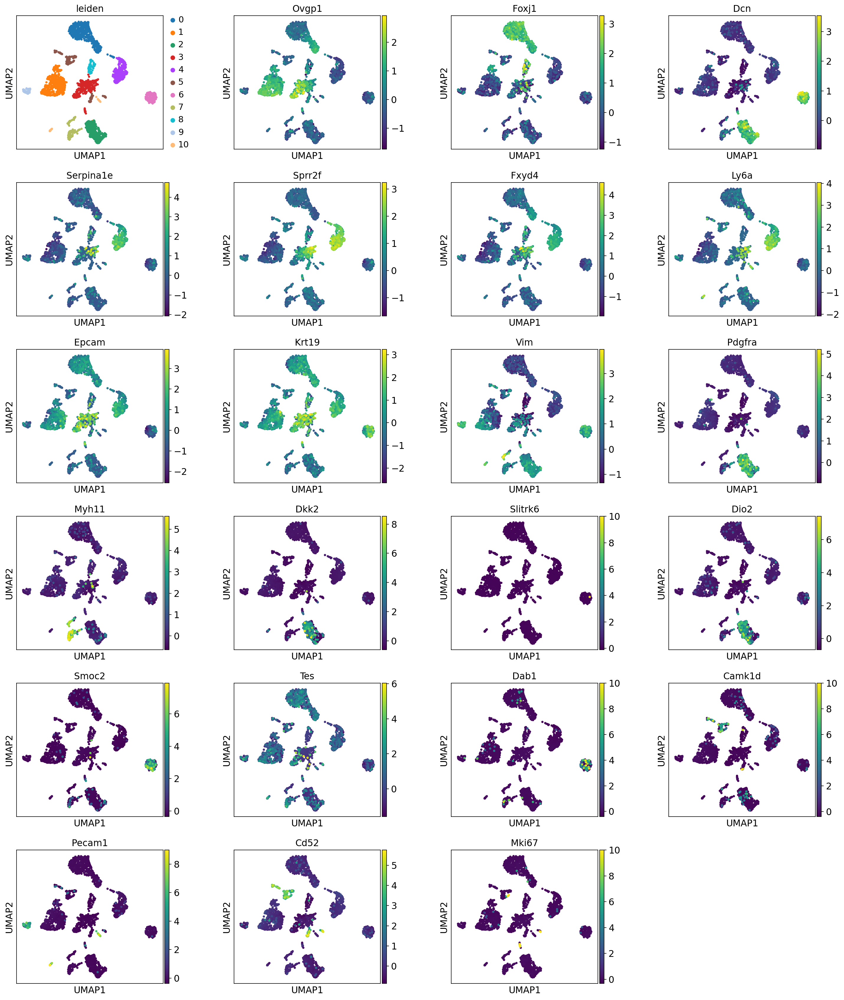

In [33]:
sc.pl.umap(Raw_adata_10x, wspace=0.35,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Serpina1e', 'Sprr2f',
                  'Fxyd4', 'Ly6a', 'Epcam', 'Krt19', 'Vim', 'Pdgfra', 'Myh11', 
                  'Dkk2', 'Slitrk6', 'Dio2', 'Smoc2', 'Tes', 'Dab1', 'Camk1d', 'Pecam1', 'Cd52','Mki67'], save = "Including_immune_cells.pdf")

## Removing immune cells

In [34]:
Estrus_subset = Raw_adata_10x[Raw_adata_10x.obs['leiden'].isin(
    ['0', '1', '2', '3','4', '6','7','8'])]

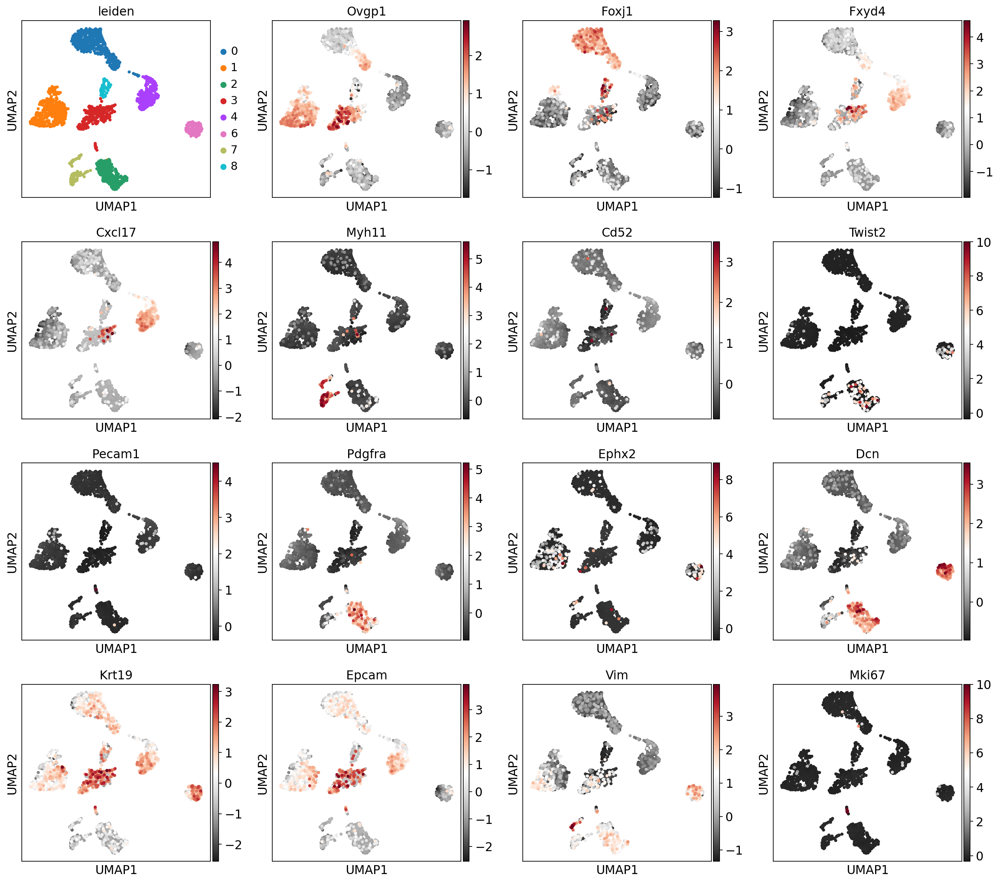

In [35]:
sc.pl.umap(Estrus_subset, 
           color_map='RdGy_r',
           color=['leiden', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Cxcl17', 'Myh11', 'Cd52', 'Twist2', 'Pecam1',
                 'Pdgfra', 'Ephx2', 'Dcn', 'Krt19', 'Epcam', 'Vim','Mki67'], save = "Immune_cells_removed.pdf")

In [36]:
Estrus_subset

View of AnnData object with n_obs × n_vars = 2328 × 19418
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

* After removing immune cells, the dataset is left with:
    + 19418 genes
    + 2328 cells

## Re-run analysis after excluding immune cells

* Below, you will have to rerun the pipeline with Estrus_subset (after removal of Cd52, and Pecam1 cells). 
* This is because PCA, neighbors, and umap are dependent on all current cells and because I removed unwanted cells I have to re-run those commands.

In [37]:
%%time
sc.tl.pca(Estrus_subset, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
CPU times: user 10.8 s, sys: 7.37 s, total: 18.2 s
Wall time: 967 ms


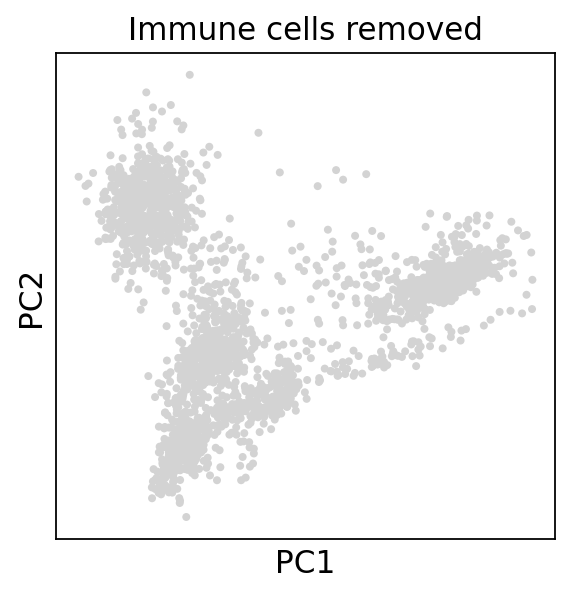

In [38]:
sc.pl.pca(Estrus_subset, title="Immune cells removed", save = "Immune_cells_removed.pdf")

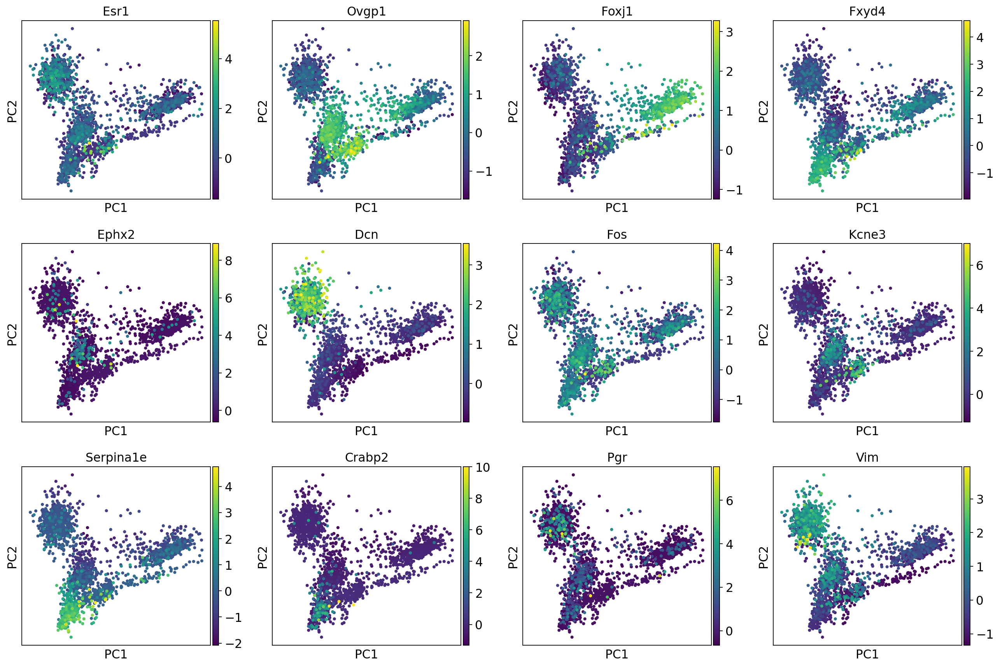

In [39]:
sc.pl.pca(Estrus_subset,
          color=['Esr1', 'Ovgp1', 'Foxj1', 'Fxyd4', 'Ephx2', 'Dcn', 'Fos', 'Kcne3', 'Serpina1e', 'Crabp2', 'Pgr', 'Vim'], save = "Immune_cells_removed1.pdf")

In [40]:
%%time
sc.pp.neighbors(Estrus_subset, n_neighbors=10, n_pcs=22)

computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
CPU times: user 1.33 s, sys: 1.62 s, total: 2.95 s
Wall time: 171 ms


In [41]:
%%time
sc.tl.umap(Estrus_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
CPU times: user 2.62 s, sys: 1.91 s, total: 4.52 s
Wall time: 1.98 s


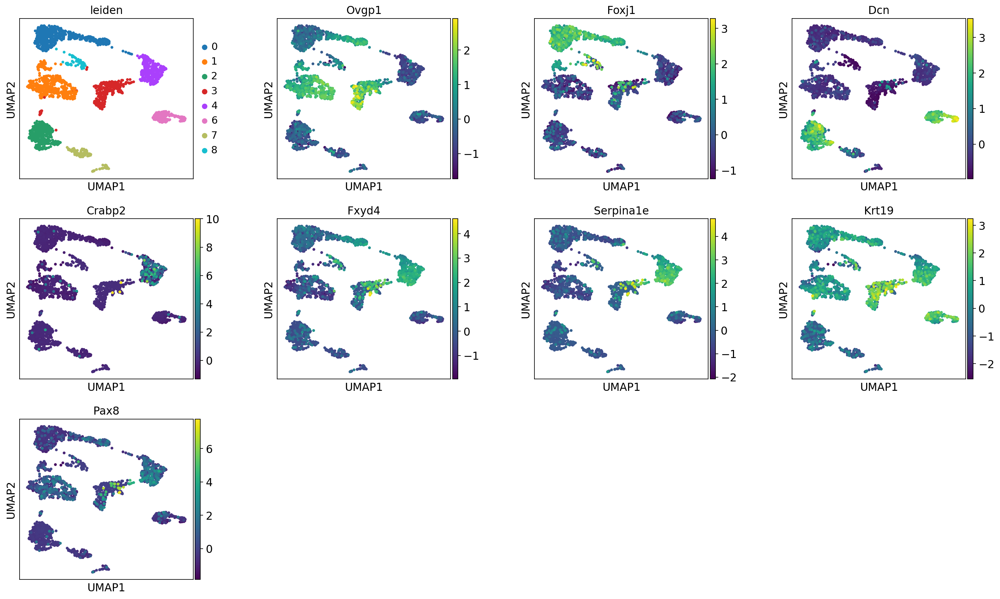

In [42]:
sc.pl.umap(Estrus_subset, wspace=0.35,
           color=['leiden', 'Ovgp1', 'Foxj1', 'Dcn', 'Crabp2', 'Fxyd4', 'Serpina1e', 'Krt19', 'Pax8'])

In [43]:
%%time
sc.tl.leiden(Estrus_subset, resolution=0.07)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
CPU times: user 48.4 ms, sys: 129 µs, total: 48.6 ms
Wall time: 48 ms


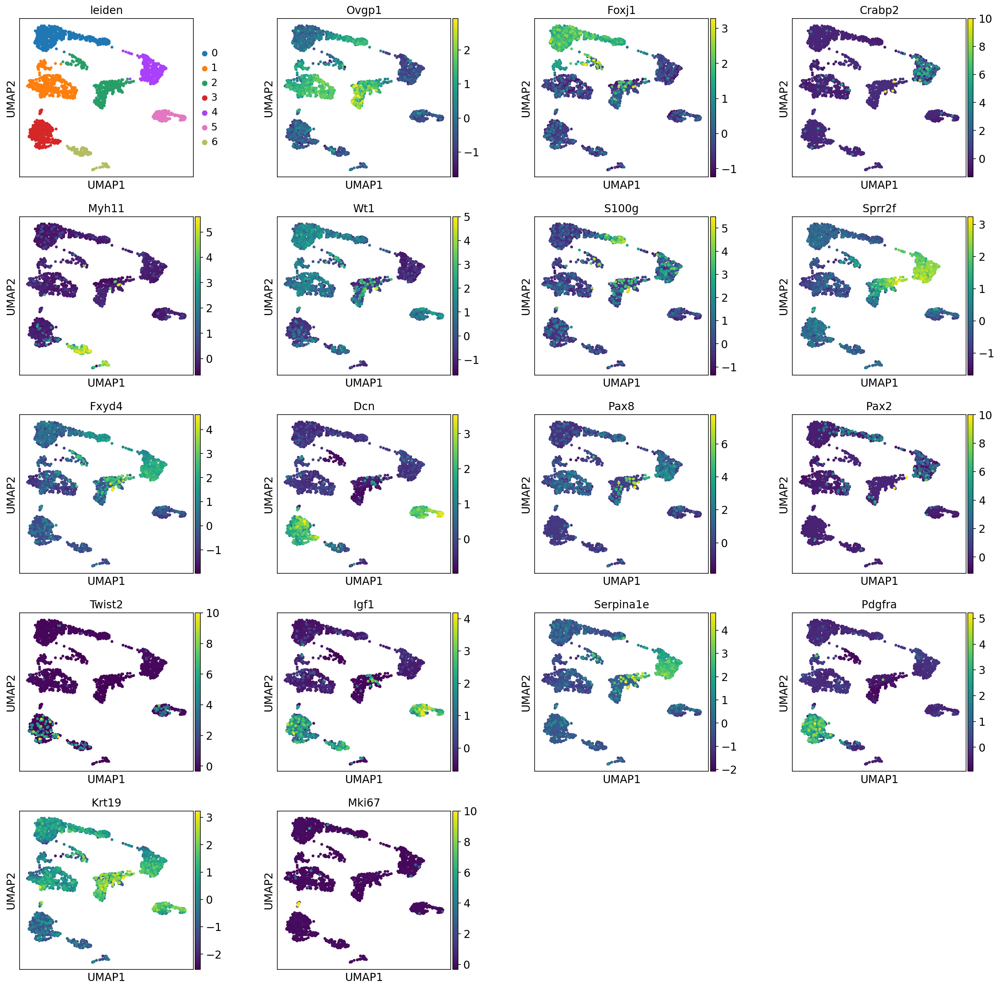

In [44]:
sc.pl.umap(Estrus_subset, wspace=0.35, 
           color=['leiden', 'Ovgp1', 'Foxj1', 'Crabp2', 'Myh11', 'Wt1', 'S100g', 'Sprr2f',
                  'Fxyd4', 'Dcn', 'Pax8', 'Pax2', 'Twist2', 'Igf1', 'Serpina1e', 'Pdgfra', 'Krt19', 'Mki67'], save = "No_immune_cells_recluster.pdf")

In [45]:
marker_genes = ['Epcam', 'Krt15','Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f', 'Fxyd4', 'Igfbp6',
                'Acta2', 'Myh11','Foxj1','Ovgp1','Wt1','Serpina1e','S100g','Pecam1'
                 ]

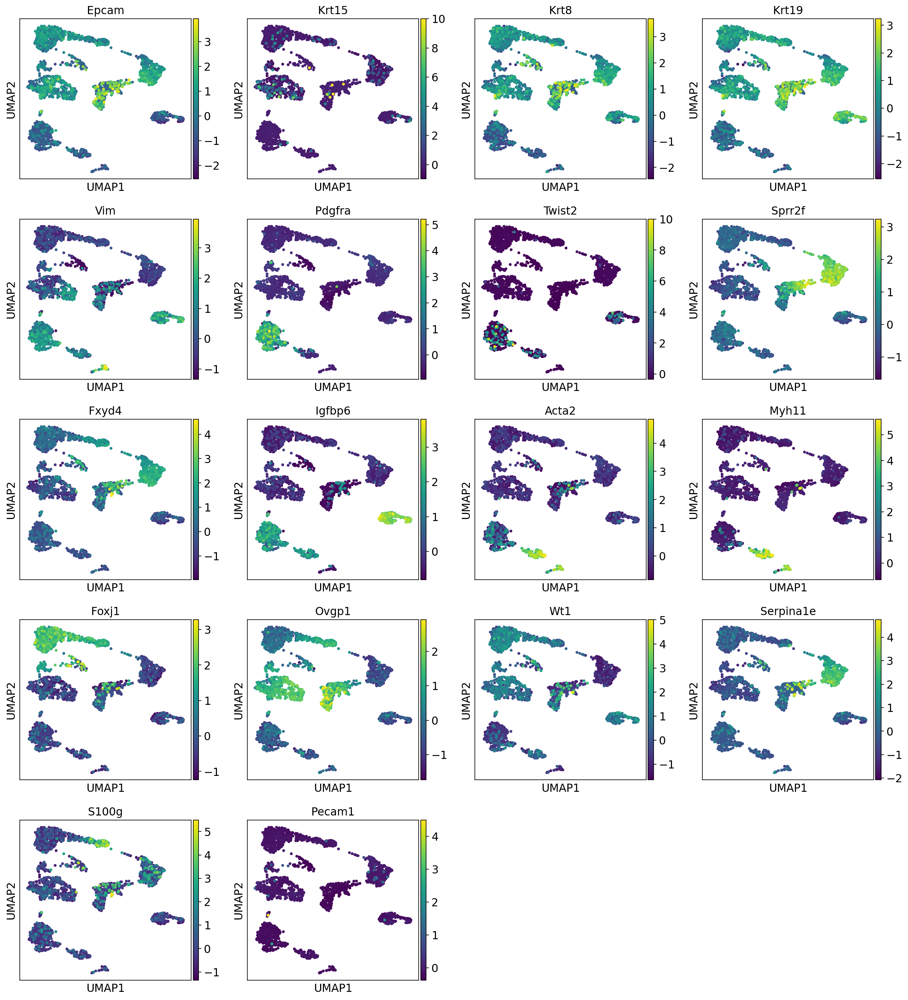

In [46]:
sc.pl.umap(Estrus_subset, color=marker_genes, save = "No_immune_cells_recluster1.pdf")

## Rename clusters

In [47]:
new_cluster_names = [
    '1 Ciliated_InfAmp',
    '2 Secretory_InfAmp',
    '3 Epithelial_subset',
    '4 Fibroblast Pdgfra+',
    '5 Secretory_IsthUTJ',
    '6 Fibroblast Pdgfra-',
    '7 Muscle']
Estrus_subset.rename_categories('leiden', new_cluster_names)

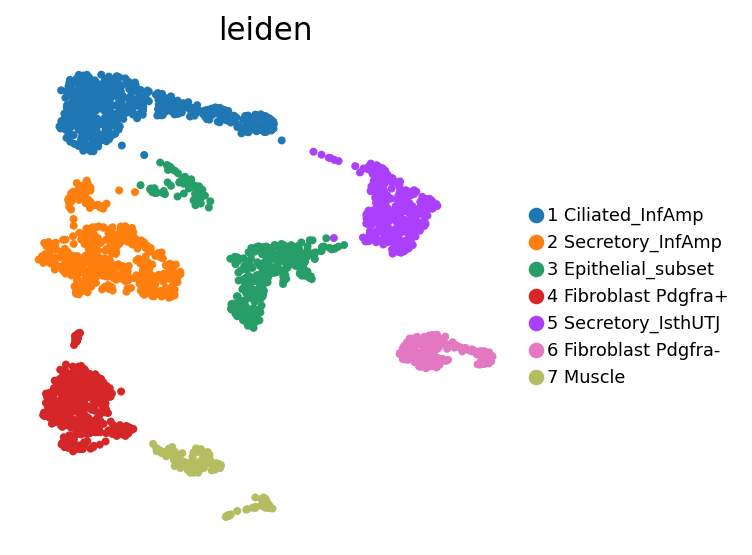

In [48]:
sc.pl.umap(Estrus_subset, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save = "Clusters_names.pdf")

In [49]:
Estrus_subset.obs.groupby(["leiden"]).apply(len)

leiden
1 Ciliated_InfAmp       535
2 Secretory_InfAmp      496
3 Epithelial_subset     360
4 Fibroblast Pdgfra+    357
5 Secretory_IsthUTJ     301
6 Fibroblast Pdgfra-    150
7 Muscle                129
dtype: int64

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns["dendrogram_['leiden']"]`


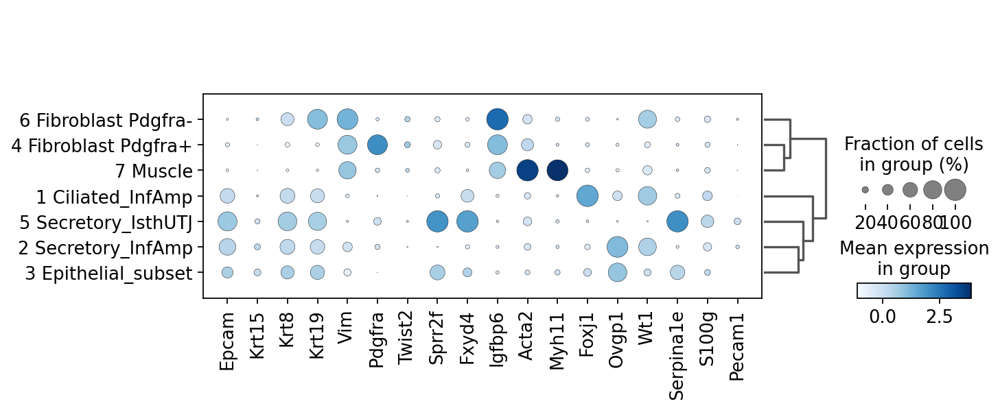

In [50]:
ax = sc.pl.dotplot(Estrus_subset, 
                   marker_genes, groupby='leiden', dendrogram=True, 
                   color_map='Blues',save = "Marker_genes.pdf")

## Extract top genes for each clusters

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


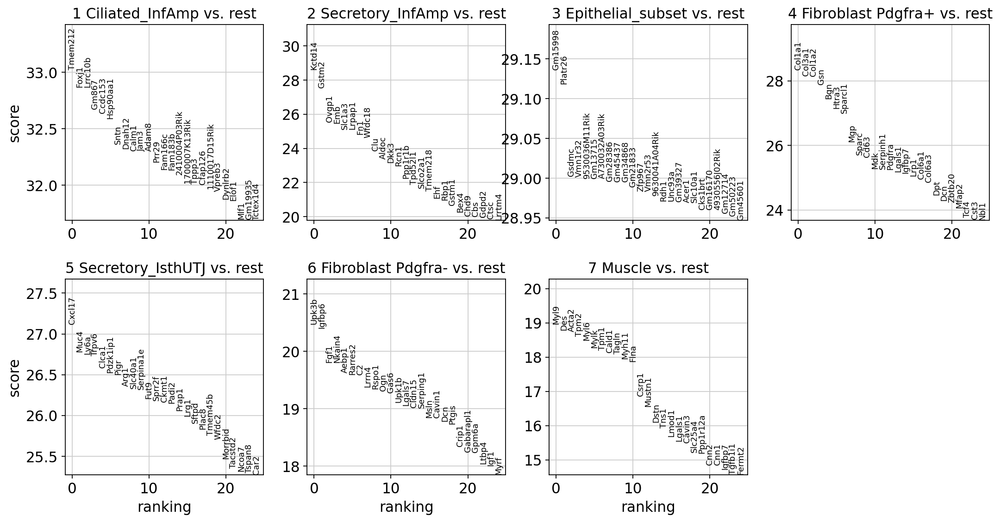

CPU times: user 4.24 s, sys: 389 ms, total: 4.63 s
Wall time: 4.63 s


In [51]:
%%time
sc.tl.rank_genes_groups(Estrus_subset, 'leiden', method='wilcoxon',n_genes=500)
sc.pl.rank_genes_groups(Estrus_subset, n_genes=25, sharey=False)

In [52]:
result = Estrus_subset.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(20)

,1 Ciliated_InfAmp_n,1 Ciliated_InfAmp_p,2 Secretory_InfAmp_n,2 Secretory_InfAmp_p,3 Epithelial_subset_n,3 Epithelial_subset_p,4 Fibroblast Pdgfra+_n,4 Fibroblast Pdgfra+_p,5 Secretory_IsthUTJ_n,5 Secretory_IsthUTJ_p,6 Fibroblast Pdgfra-_n,6 Fibroblast Pdgfra-_p,7 Muscle_n,7 Muscle_p
0,Tmem212,3.739252e-239,Kctd14,4.186346e-180,Gm15998,1.235351e-186,Col1a1,9.425908e-177,Cxcl17,5.570340e-162,Upk3b,3.509661e-93,Myl9,3.329222e-80
1,Foxj1,6.085777e-237,Gstm2,2.906534e-167,Platr26,2.100772e-186,Col3a1,1.554824e-174,Muc4,5.450697e-158,Igfbp6,1.707729e-92,Des,1.010695e-78
2,Lrrc10b,6.144756e-237,Ovgp1,6.148154e-144,Gsdmc,6.082664e-185,Col1a2,2.821290e-174,Ly6a,1.135629e-157,Fgf1,2.521994e-87,Acta2,2.224017e-78
3,Gm867,3.447973e-234,Emb,3.554551e-143,Vmn1r32,6.297229e-185,Gsn,4.569415e-171,Trpv6,1.799339e-157,Nkain4,2.921692e-87,Tpm2,2.962938e-77
4,Ccdc153,1.156051e-233,Slc1a3,2.286235e-139,9530036M11Rik,6.584242e-185,Bgn,9.664926e-166,Clca1,9.256064e-156,Aebp1,9.790264e-86,Myl6,2.806260e-76
5,Hsp90aa1,5.981259e-233,Lrpap1,2.556716e-139,Gm13715,6.584242e-185,Htra3,3.519110e-162,Pdzk1ip1,5.338184e-155,Rarres2,1.592379e-85,Mylk,1.460161e-74
6,Sntn,8.301510e-230,Fn1,4.029163e-136,A730032A03Rik,6.641549e-185,Sparcl1,1.324420e-160,Pigr,8.889048e-155,C2,1.604211e-85,Tpm1,4.674510e-74
7,Dnah12,3.210234e-229,Wfdc18,4.998341e-134,Gm28386,7.305780e-185,Mgp,3.231512e-150,Arg1,4.098453e-153,Lrrn4,1.181164e-83,Cald1,1.450785e-73
8,Calm1,5.903712e-229,Clu,5.679418e-126,Gm45437,7.507468e-185,Sparc,8.410892e-146,Slc40a1,8.319138e-153,Rspo1,2.151719e-83,Tagln,2.952324e-73
9,Jam3,6.175612e-229,Aldoc,8.248383e-121,Gm34868,7.507468e-185,Cd63,4.967236e-145,Serpina1e,1.216917e-152,Ogn,4.295193e-83,Myh11,4.855146e-72


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


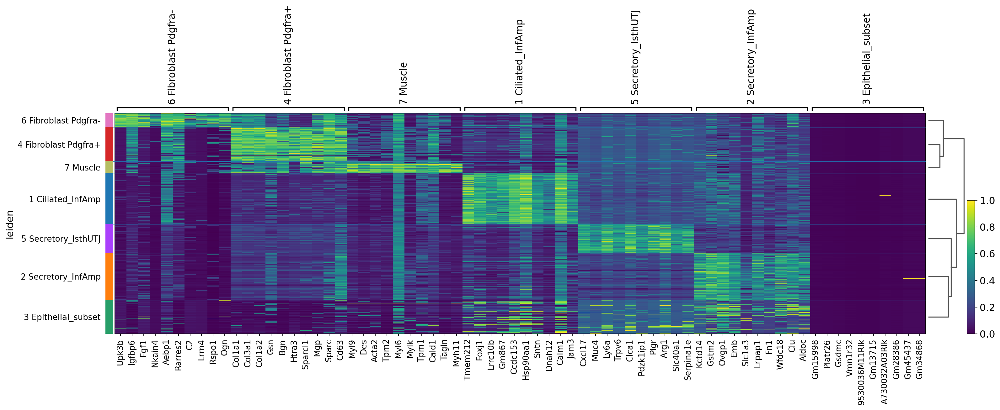

In [53]:
sc.pl.rank_genes_groups_heatmap(Estrus_subset, n_genes=10,
                                standard_scale='var',
                                groupby='leiden',
                                show_gene_labels=True, save = "Top10_genes.pdf")

In [54]:
Estrus_subset.write('./Estrus_subset_analyzed.h5ad')